# **Advanced Lane Finding Project on the Road** 
***
In this project, I will use the tools I learned about in lesson to identify lane lines on the road.

The goals / steps of this project are following:
* Compute camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.


In [1]:
import cv2
import glob
import pickle
import numpy as np
from moviepy.editor import VideoFileClip

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.gridspec as gridspec
%matplotlib inline

In [2]:
class Camera:
    def __init__(self, nx, ny, show_images=False):
        # x points in test images
        self.nx = nx
        # y points in test images
        self.ny = ny
        # Camera matrix
        self.mtx = 0
        # Camera distortion coefficients
        self.dist = 0
        # Camera rotation vectors
        self.rvecs = 0
        # Camera translation vectors
        self.tvecs = 0
        # calibration status
        self.calibrated = False
        # Show images
        self.show_images = show_images
        # Source coords for perspective xform
        self.src = np.float32([[240,719],
                         [579,450],
                         [712,450],
                         [1165,719]])
        # Destination coords for perspective xform
        self.dst = np.float32([[300,719],
                         [300,0],
                         [900,0],
                         [900,719]])
        # Perspective transform matrix
        self.M = cv2.getPerspectiveTransform(self.src, self.dst)
        # Inverse perspective tramsform matrix
        self.Minv = cv2.getPerspectiveTransform(self.dst, self.src)
      
    def calibrate(self, files):
        print('Calibrating camera...')
        
        # Read images and make a list of calibration images
        images = glob.glob(files)

        # Initialize image and object points
        objpoints = [] # 3D points in real world space
        imgpoints = [] # 2D points in image plane

        # Generate object points
        objp = np.zeros((self.ny*self.nx, 3), np.float32)
        objp[:,:2] = np.mgrid[0:self.nx, 0:self.ny].T.reshape(-1, 2)

        # Define figures
        if self.show_images:
            fig = plt.figure(figsize=(15,15))
            fig.subplots_adjust(hspace=.5)
            i = 1

        # Read images and find chessboard corners
        for image in (images):
            # Read image
            img = mpimg.imread(image)
            
            # Convert to gray
            gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
            
            # Find chessboard corners
            ret, corners = cv2.findChessboardCorners(gray, (self.nx, self.ny), None)
            
            if ret == True:
                objpoints.append(objp)
                imgpoints.append(corners)
                
                # Draw and display corners
                cv2.drawChessboardCorners(img, (self.nx, self.ny), corners, ret)

                if self.show_images:
                    ax = plt.subplot(10, 10, i)
                    ax.set_yticklabels([])
                    ax.set_xticklabels([])
                    i=i+1
                    plt.imshow(img)
            
        if self.show_images:
            plt.show()
            
        # Set camera calibration parameters
        img_size = gray.shape[::-1]
        ret, self.mtx, self.dist, self.rvecs, self.tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
        self.calibrated = True

    
    def undistort(self, img):
        if self.calibrated == True:
            return cv2.undistort(img, self.mtx, self.dist, None, self.mtx)
        else:
            print('Camera has not been calibrated')
            return None
        
            
    def threshold_binary(self, img):
        if self.show_images:
            self.imshow(img, 'Orignial Image')
            
        # Convert to gray
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        
        # Sobel x
        sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
        abs_sobelx = np.absolute(sobelx)
        scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
        if self.show_images:
            self.imshow(scaled_sobel, 'Sobel X')

        # Threshold x gradinet
        thresh_min = 30
        thresh_max = 150
        sx_binary = np.zeros_like(scaled_sobel)
        retval, sx_thresh = cv2.threshold(scaled_sobel, thresh_min, thresh_max, cv2.THRESH_BINARY)
        sx_binary[(sx_thresh >= thresh_min) & (sx_thresh <= thresh_max)] = 1
        if self.show_images:
            self.imshow(sx_binary, 'Threshold Gradient')

        # Convert to HLS color and separate S channel
        hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        s_channel = hls[:,:,2]
        if self.show_images:
            self.imshow(s_channel, 'S Channel')

        # Threshold color channel
        s_thresh_min = 175
        s_thresh_max = 250
        s_binary = np.zeros_like(s_channel)
        s_thresh = cv2.inRange(s_channel.astype('uint8'), s_thresh_min, s_thresh_max)
        s_binary[(s_thresh == 255)] = 1

        if self.show_images:
            self.imshow(s_binary, 'Threshold Binary')
        
        # Stack each channel to view their individual contributions in green and blue respectively
        if self.show_images:
            color_binary = np.dstack((np.zeros_like(sx_thresh), sx_thresh, s_thresh))
            self.imshow(color_binary, 'Stacked Color Binary')
            
        # Combine the two binary thresholds
        combined_binary = np.zeros_like(sx_binary)
        combined_binary[(s_binary == 1) | (sx_binary == 1)] = 1
        
        # Plotting thresholded images
        if self.show_images:
            self.imshow(combined_binary, 'Combined S channel and gradient thresholds')

        return combined_binary

    def perspective_transform(self, img):
        img_size = (img.shape[1], img.shape[0])
        return cv2.warpPerspective(img, self.M, img_size, flags=cv2.INTER_LINEAR)
    
    def imshow(self, img, title):
        plt.imshow(img, cmap='gray')
        plt.title(title)
        plt.show()

# ** Camera **
Camera class is responsible for calibrating camera, undistorting images, thresholding binary images, and perspective transforming of images.

** Camera Calibration **

The code for camera calibration can be found in *calibrate()* method. This method get image names as parameter. It first uses *cv2.findChessboardCorners()* to detect chessboard corners in the calibration images and *cv2.calibrateCamera()* to calculate the distortion coefficients and the camera matrix. This code will show the detected corners on the images.

Calibrating camera...


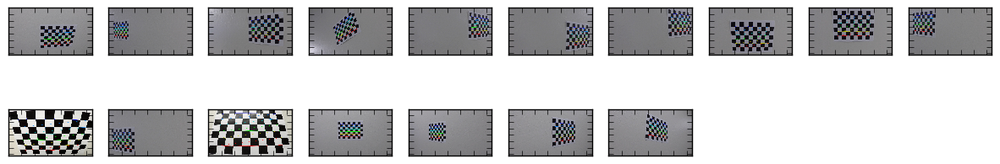

In [3]:
# Calibrating camera
camera = Camera(nx=9, ny=6, show_images=True)
camera.calibrate("./camera_calibration_images/calibration*.jpg")

** Undistorting Image **

I applied distortion correction to test image using *cv2.undistort()* function.

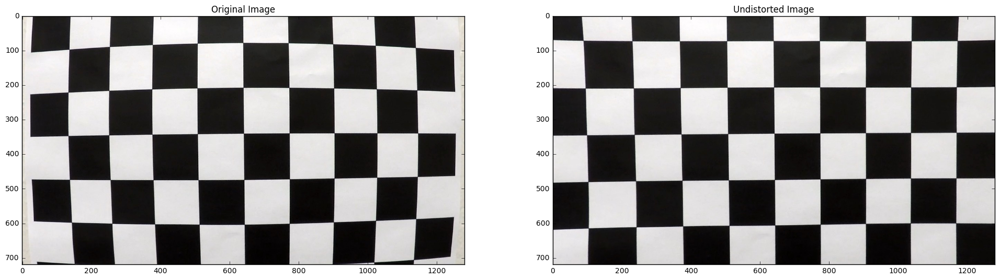

In [4]:
# Undistort test calibration image
img = mpimg.imread("./camera_calibration_images/calibration1.jpg")
img_undist = camera.undistort(img)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
ax1.imshow(img)
ax1.set_title('Original Image')
ax2.imshow(img_undist)
ax2.set_title('Undistorted Image')
plt.show()

** Perspective Transform **

In order to calculate the transformation matrix for the perspective transform I first measured the coordinates of four corner points of a straight lane.

    Source =      [[240,719], [579,450], [712,450], [1165,719]] 	
    Destination = [[300,719], [300,0], [900,0], [900,719]]
 
Method *perspective_transform()* does perspective transformation. The source and destination points are used to calculate the transformation matrix M with the function *cv2.getPerspectiveTransform()*. The undistorted input image is then transformed into a bird-eye view by a call to *cv2.warpPerspective()*.

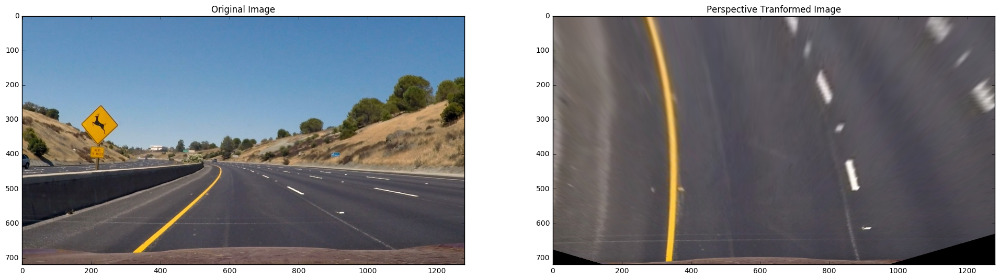

In [5]:
# Show perspective transformed image
img = mpimg.imread("./test_images/test2.jpg")
img_undist = camera.undistort(img)
img_perspective = camera.perspective_transform(img_undist)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
ax1.imshow(img)
ax1.set_title('Original Image')
ax2.imshow(img_perspective)
ax2.set_title('Perspective Tranformed Image')
plt.show()

** Binary Thresholding **

With thresholding we process the undistorted image and attemp to mask out the pixels that are part of lane lines and remove others. Based what I learnt from the lesson, I've created two separate binary images (Threshold and InRange binaries) and finally combine both to generate the result.
1. Input RGB -> Convert Gray -> Sobel X -> Threshold Binary 
2. Input RGB -> Convert HLS -> InRange Binary 




Calibrating camera...


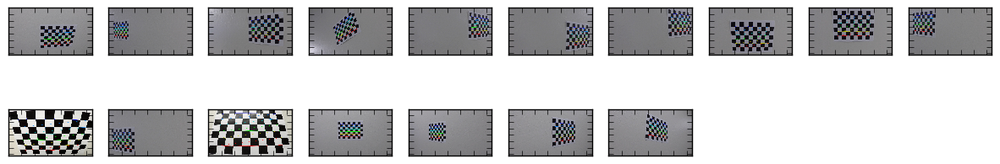


 Binary image thresholding step by step


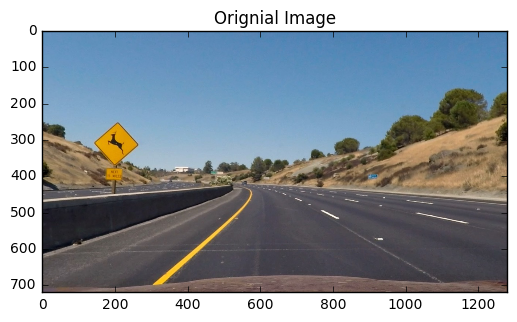

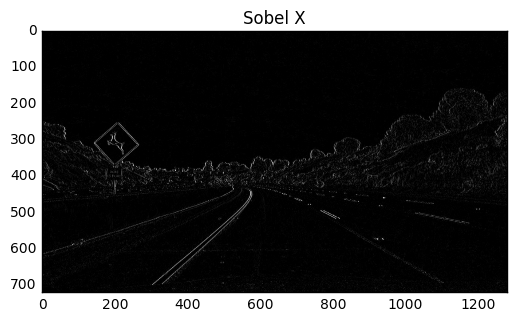

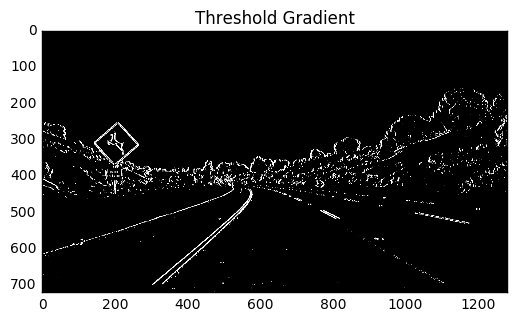

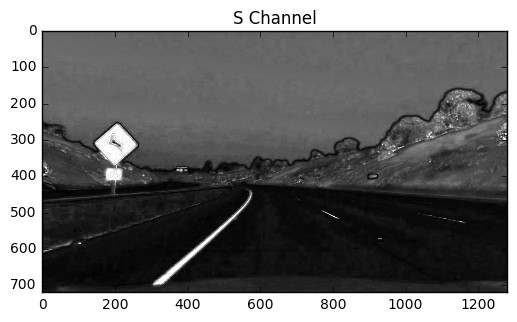

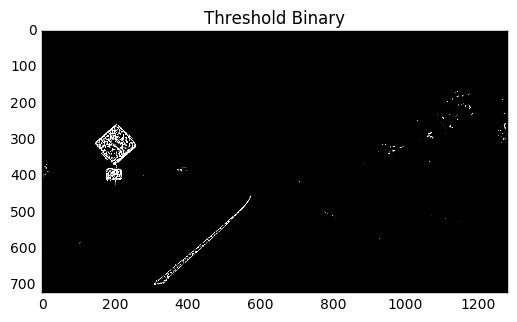

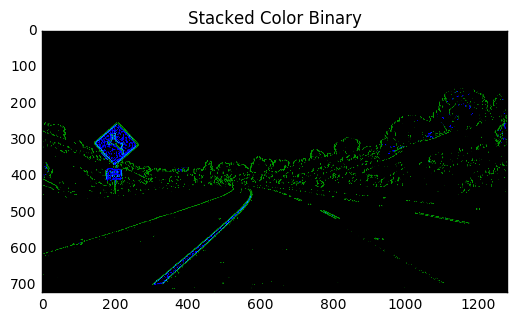

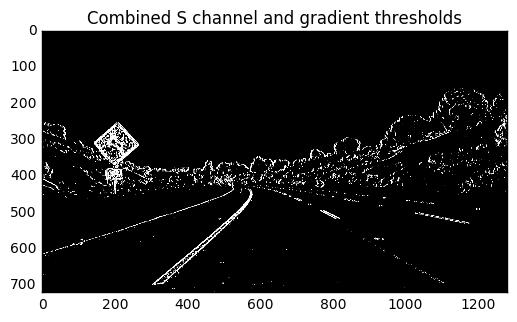

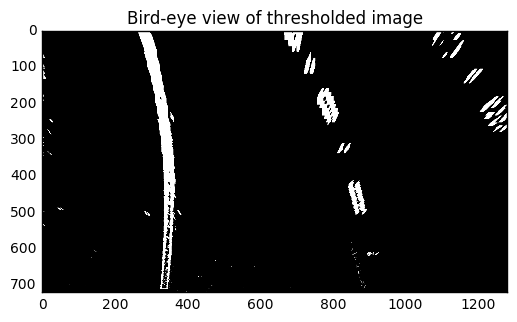

In [6]:
# Calibrating camera
camera = Camera(nx=9, ny=6, show_images=True)
camera.calibrate("./camera_calibration_images/calibration*.jpg")

print('\n Binary image thresholding step by step')
img = mpimg.imread("./test_images/test2.jpg")
img_undist = camera.undistort(img)
img_threshold = camera.threshold_binary(img_undist)
img_perspective = camera.perspective_transform(img_threshold)

plt.imshow(img_perspective, cmap='gray')
plt.title('Bird-eye view of thresholded image')
plt.show()

In [7]:
class LaneDetector:
    def __init__(self, show_images=False):
        # Frame counter (used for finding new lanes)
        self.frame_number = 0
        
        # Lane locations from previous frame
        self.last_left_x = 0
        self.last_right_x = 0
        
        # Lane locations from current frame
        self.left_x = 0
        self.right_x = 0
        
        # Lane perspective image
        self.left_lane_img = 0
        self.right_lane_img = 0
        
        # Lane persp debug image
        self.lane_debug_img = 0

        # Frames since lane last detected
        self.left_last_seen = 9999
        self.right_last_seen = 9999
        
        # Lane fit coordinates
        self.left_fitx = 0
        self.left_fity = 0
        self.right_fitx = 0
        self.right_fity = 0
        
        # Lane radius of curvature
        self.left_curverad = 0
        self.right_curverad = 0
        
        # Lanes found in last frame?
        self.left_lane_found  = False
        self.right_lane_found = False
        
        # Lane polynomial fits
        self.left_fit = []
        self.right_fit = []

        # Test Mode
        self.show_images = show_images
        
        # Define colors
        self.color_red = (255, 0, 0)
        self.color_green = (0, 255, 0)
        self.color_blue = (0, 0, 255)
        self.color_white = (255, 255, 255)

    def get_x_peaks(self, hist):
        """
        Find the peak of the left and right halves of the histogram as starting point for the left and right lanes
        """
        midpoint_x = int(len(hist)/2)
        
        left_side = hist[0:midpoint_x]
        left_peak_x = np.argmax(left_side)
        
        right_side = hist[midpoint_x:]
        right_peak_x = np.argmax(right_side)
        
        right_peak_x += midpoint_x
        
        return left_peak_x, right_peak_x

    def get_two_peak_x_coords(self, hist, prev_left_x=-1, prev_right_x=-1, start_y=0, end_y=0, found_last_left=False, found_last_right=False, left_trend=0, right_trend=0):
        num_pixels_x = len(hist)

        left_window = 40 
        right_window = 40 
        found_left = True
        found_right = True

        if not found_last_left:
            left_window = 60
        if not found_last_right:
            right_window = 60

        if start_y == 720:
            left_window = 100 
            right_window = 100 

        left_offset = 0
        if self.left_lane_found:
            new_left_peak = int(self.left_fit[0]*start_y**2 + self.left_fit[1]*start_y + self.left_fit[2])
            if self.show_images:
                cv2.rectangle(self.lane_debug_img, (new_left_peak-left_window,start_y), (new_left_peak+left_window, end_y), (0, 255, 0),  thickness=2)
        else:
            left_side = hist[prev_left_x+left_trend-left_window:prev_left_x+left_trend+left_window]
            if self.show_images:
                cv2.rectangle(self.lane_debug_img, (prev_left_x+left_trend-left_window,start_y), (prev_left_x+left_trend+left_window, end_y), (255, 0, 0),  thickness=2)

            new_left_peak = 0
            if len(left_side) > 0:
                new_left_peak = np.argmax(left_side)
                left_offset = prev_left_x+left_trend - left_window
            
            if new_left_peak == 0 or len(left_side) == 0:
                new_left_peak = prev_left_x+left_trend
                left_offset = 0
                found_left = False

        left_peak_x = new_left_peak + left_offset
        if self.show_images:
            cv2.line(self.lane_debug_img, (left_peak_x, start_y), (left_peak_x, end_y), (0, 255, 255), thickness=2)

        right_offset = 0
        if self.right_lane_found:
            new_right_peak = int(self.right_fit[0]*start_y**2 + self.right_fit[1]*start_y + self.right_fit[2])
            if self.show_images:
                cv2.rectangle(self.lane_debug_img, (new_right_peak-right_window,start_y), (new_right_peak+right_window, end_y), (0, 255, 0),  thickness=2)
        else:
            right_side = hist[prev_right_x+right_trend-right_window:prev_right_x+right_trend+right_window]
            if self.show_images:
                cv2.rectangle(self.lane_debug_img, (prev_right_x+right_trend-right_window,start_y), (prev_right_x+right_trend+right_window, end_y), (255, 255, 0),  thickness=2)

            new_right_peak = 0
            if len(right_side) > 0:
                new_right_peak = np.argmax(right_side)
                right_offset = prev_right_x+right_trend - right_window
            
            if new_right_peak == 0 or len(right_side) == 0:
                new_right_peak = prev_right_x+right_trend
                right_offset = 0
                found_right = False

        right_peak_x = new_right_peak + right_offset

        if self.show_images:
            cv2.line(self.lane_debug_img, (right_peak_x, start_y), (right_peak_x, end_y), (0, 255, 255), thickness=2)

        if start_y == 720:
            new_left_trend = 0
            new_right_trend = 0
        else:
            new_left_trend = left_peak_x - prev_left_x 
            new_right_trend = right_peak_x - prev_right_x

        return left_peak_x, right_peak_x, found_left, found_right, new_left_trend, new_right_trend
    

    def detect_lanes(self, img):
        """
            img: The binary warped image
        """
        if self.show_images:
            print("Frame # {}".format(self.frame_number))
        
        # Is this the first frame of video?
        if self.frame_number == 0 or self.left_last_seen > 5 or self.right_last_seen > 5:
            # Generate histogram over bottom half of image
            histogram = np.sum(img[int(img.shape[0]/2):,:], axis=0)
            
            # Find X coords of two peaks (left and right) of histogram
            est_left_x, est_right_x = self.get_x_peaks(histogram)
            
            if self.show_images:
                plt.imshow(img, cmap='gray')
                plt.show()
                plt.plot(histogram)
                plt.show()
        else:
            est_left_x = self.last_left_x
            est_right_x = self.last_right_x

        fallback_left_x = est_left_x
        fallback_right_x = est_right_x
        left_trend = 0
        right_trend = 0
    
        # Run a sliding window up the image to detect pixels
        self.left_lane_img = np.zeros(img.shape[0:2], np.float32)
        self.right_lane_img = np.zeros(img.shape[0:2], np.float32)
        temp_img = img*255
        self.lane_debug_img = np.dstack((temp_img, temp_img, temp_img))
    
        found_last_left = False
        found_last_right = False
        left_window = 40
        right_window = 40
        left_conc_sections = 0
        right_conc_sections = 0
        nwindows = 10 # Number of sliding windows 
        for i in range(nwindows, 0, -1):
            start_y = int(i * img.shape[0]/nwindows)
            end_y = int((i-1) * img.shape[0]/nwindows)
            img_sect = img[end_y:start_y,:]
            histogram = np.sum(img_sect, axis=0)
            left_x, right_x, found_last_left, found_last_right, new_left_trend, new_right_trend = self.get_two_peak_x_coords(histogram, est_left_x, est_right_x,start_y, end_y, found_last_left, found_last_right, left_trend, right_trend)
            left_trend = int((new_left_trend + left_trend) / 2)
            right_trend = int((new_right_trend + right_trend) / 2)

            # Store the left/right x values for bottom of image
            if i == 10:
                # Set the new last values
                self.left_x = left_x
                self.right_x = right_x

            if not found_last_left:
                left_x = fallback_left_x
                left_conc_sections = 0
            elif left_conc_sections > 1:
                fallback_left_x = left_x

            if not found_last_right:
                right_x = fallback_right_x
                right_conc_sections = 0
            elif right_conc_sections > 1:
                fallback_right_x = right_x

            if found_last_left:
                left_conc_sections += 1
            
            if found_last_right:
                right_conc_sections += 1
          
            if self.show_images:
                f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
                f.tight_layout()
                ax1.plot(histogram)
                ax2.imshow(img_sect, cmap='gray')
                plt.show()
    
            # Fill in the left lane image
            left_mask = np.zeros_like(img_sect)
            left_mask[:,left_x-left_window:left_x+left_window]=1
            mask = (left_mask==1)
            self.left_lane_img[end_y:start_y,:] = img_sect & mask
    
            # Fill in the right lane image
            right_mask = np.zeros_like(img_sect)
            right_mask[:,right_x-right_window:right_x+right_window]=1
            mask = (right_mask==1)
            self.right_lane_img[end_y:start_y,:] = img_sect & mask
    
            # Set the new last values
            est_left_x = left_x
            est_right_x = right_x

        self.frame_number += 1

    def fit_lane(self, img):
        # Extract the list of x and y coords that are non-zero pixels
        xycoords = np.nonzero(img)
        x_arr = xycoords[1]
        y_arr = xycoords[0]
    
        # Fit a second order polynomial to each fake lane line
        fit = np.polyfit(y_arr, x_arr, deg=2)
        fitx = fit[0]*y_arr**2 + fit[1]*y_arr + fit[2]
    
        # Ensure we have points for min(0) & max(719) y
        # This will extend the lines in cases where the lanes
        # dont have pixels all the way to top/bottom of image
        fitx = np.insert(fitx, 0, fit[0]*0**2 + fit[1]*0 + fit[2])
        fity = np.insert(y_arr, 0, 0)
        fitx = np.append(fitx, fit[0]*719**2 + fit[1]*719 + fit[2])
        fity = np.append(fity, 719)
    
        # Define conversions in x and y from pixels space to meters
        ym_per_pix = 30/720 # meters per pixel in y dimension
        xm_per_pix = 3.7/700 # meteres per pixel in x dimension
        y_eval = np.max(y_arr)
        fit_cr = np.polyfit(y_arr*ym_per_pix, x_arr*xm_per_pix, 2)
        fitx_cr = fit_cr[0]*(y_arr*ym_per_pix)**2 + fit_cr[1]*y_arr*ym_per_pix + fit_cr[2]
    
        # Get radius of curvature
        curverad = ((1 + (2*fit_cr[0]*y_eval + fit_cr[1])**2)**1.5)/np.absolute(2*fit_cr[0])

        return fit, fitx, fity, curverad

    def check_lane(self, new_roc, prev_roc, new_x, prev_x):
        lane_is_ok = True
        
        # Check Radius of Curvative (RoC) against standards
        if new_roc < 587:
            lane_is_ok = False

        # Check previous x coord versus current for major difference 
        delta = 15
        if new_x > prev_x + delta or new_x < prev_x - delta:
            lane_is_ok = False

        return lane_is_ok

    def fit_lanes(self):
        self.left_lane_found = False
        self.right_lane_found = False
        
        # Get new lane fit for left lane
        left_fit, left_fitx, left_fity, left_curverad = self.fit_lane(self.left_lane_img)
        
        # For smoothing only use this new lane fit if it's close to the previous one
        if self.frame_number == 1 or self.check_lane(left_curverad, self.left_curverad, self.left_x, self.last_left_x):
            self.left_fit = left_fit
            self.left_fitx = left_fitx
            self.left_fity = left_fity
            self.left_curverad = left_curverad
            self.left_lane_found = True
            self.left_last_seen = 0
            self.last_left_x = self.left_x
        else:
            self.left_last_seen += 1

        # Get new lane fit for right lane
        right_fit, right_fitx, right_fity, right_curverad = self.fit_lane(self.right_lane_img)
        # Only use this new lane fit if it's close to the previous one (for smoothing)
        if self.frame_number == 1 or self.check_lane(right_curverad, self.right_curverad, self.right_x, self.last_right_x):
            self.right_fit = right_fit
            self.right_fitx = right_fitx
            self.right_fity = right_fity
            self.right_curverad = right_curverad
            self.right_lane_found = True
            self.right_last_seen = 0
            self.last_right_x = self.right_x
        else:
            self.right_last_seen += 1

    def draw_lanes(self, img, warped, Minv):
        # Create an empty image to draw on and an image to show the selection window
        warp_zero = np.zeros_like(warped).astype(np.uint8)
        color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
        # Recast the x and y points into usable format for cv2.fillPoly()
        pts_left = np.array([np.transpose(np.vstack([self.left_fitx, self.left_fity]))])
        pts_right = np.array([np.flipud(np.transpose(np.vstack([self.right_fitx, self.right_fity])))])
        pts = np.hstack((pts_left, pts_right))
    
        # Draw the lane onto the warped blank image
        cv2.fillPoly(color_warp, np.int_([pts]), self.color_green)

        # Draw lane lines only if lane was detected this frame
        if self.left_lane_found == True:
            cv2.polylines(color_warp, np.int_([pts_left]), False, self.color_blue, thickness=20)
        if self.right_lane_found == True:
            cv2.polylines(color_warp, np.int_([pts_right]), False, self.color_red, thickness=20)

        # Warp the blank back to original image space using inverse perspective matrix (Minv)
        new_warp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0]))
        # Combine the result with the original image
        result = cv2.addWeighted(img, 1, new_warp, 0.3, 0)

        # Write some useful text information on the orignial image
        # Write the radius of curvature for each lane 
        font = cv2.FONT_HERSHEY_SIMPLEX
        font_scale = 1
        font_tickness = 2
        left_roc = "Left Roc  : {0:.2f}m".format(self.left_curverad) 
        cv2.putText(result, left_roc, (10,270), font, font_scale, self.color_white, font_tickness)
        right_roc = "Right Roc : {0:.2f}m".format(self.right_curverad) 
        cv2.putText(result, right_roc, (10,400), font, font_scale, self.color_white, font_tickness)
    
        # Write the x coordinates for each lane 
        left_coord =  "Left X  : {0:.2f}".format(self.left_x) 
        cv2.putText(result, left_coord, (10,320), font, font_scale, self.color_white, font_tickness)
        right_coord = "Right X : {0:.2f}".format(self.last_right_x) 
        cv2.putText(result, right_coord, (10,450), font, font_scale, self.color_white, font_tickness)

        # Write distance from center
        perfect_center = 1280/2.
        lane_x = self.last_right_x - self.left_x
        center_x = (lane_x / 2.0) + self.left_x
        cms_per_pixel = 370.0 / lane_x   # US regulation lane width = 3.7m
        dist_from_center = (center_x - perfect_center) * cms_per_pixel
        if dist_from_center < 0:
            dist_text = "{0:.2f}cms left of center".format(dist_from_center)
        else:
            dist_text = "{0:.2f}cms right of center".format(dist_from_center)
        cv2.putText(result, dist_text, (10,530), font, font_scale, self.color_white, font_tickness)
    
        return result

# ** Lane Detector **

** Detect Lines **

The lane line detection and polynomial fitting is handeled by the class *LaneDetector*. At the first, I generate a histogram of lower half of the image. Then find the two picks(left and right) in this histogram as a starting point to start searching for left and right lanes. Then, I divided the image into 10 horizontal strips of equal size and try to extract the pixels belong to lane and discarded all noisy pixels in each strip. In each step, I've used the previous frame to estimate the *left_x* and *right_x*.

** Fit Lines **

After a pass of windows through the image, I used the Numpy *polyfit()* function to fit a polynomial equation to each lane. After calculating, I checked to determine if the calculated line is good or not:
* The Radius of Curvature(RoC) should be above than a minimum threshold. [U.S. government specification for highway curvature](http://onlinemanuals.txdot.gov/txdotmanuals/rdw/horizontal_alignment.htm#BGBHGEGC)
* Check the current frame with previous frame. it shouldn't change too much from the previous one. I choose 15 pixel data.


** Darw Lines **

Finally I draw the detected lines and its polynomial back onto the undistorted image. For doing this, we have to do inverse perspective mapping because the lines have been detected in the perspective view. I also annotate the bird-eye view image, *left_x*, *right_x*, and Radius of Curvature(RoC) onto the image.

In [8]:
def process_image(img):
    # Apply distortion 
    img_undistort = camera.undistort(img)
    
    # Get binary image using threshold
    img_binary = camera.threshold_binary(img_undistort)
    
    # Apply perspective transformation
    img_perspective = camera.perspective_transform(img_binary)

    # Locate the lane lines
    laneDetector.detect_lanes(img_perspective)
    
    # Fit polynominals and set lane x/y arrays
    laneDetector.fit_lanes()
    
    # Draw lines back onto road
    img_combined = laneDetector.draw_lanes(img_undistort, img_perspective, camera.Minv)
    
    # Annoate the bird-eye view
    img_perspective = camera.perspective_transform(img_undistort)
    width, height = img_perspective.shape[:2]
    width = int(width/3)
    height = int(height/3)
    img_small_perspective = cv2.resize(img_perspective, (height, width), interpolation = cv2.INTER_AREA)
    img_combined[0:width, 0:height] = img_small_perspective

    return img_combined


# ** Images Pipeline **

Calibrating camera...
Processing image ./test_images/test1.jpg
Processing image ./test_images/test2.jpg
Processing image ./test_images/test3.jpg
Processing image ./test_images/test4.jpg
Processing image ./test_images/test5.jpg
Processing image ./test_images/test6.jpg


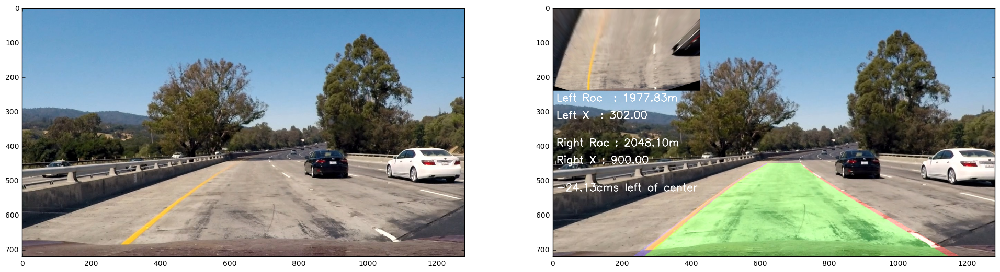

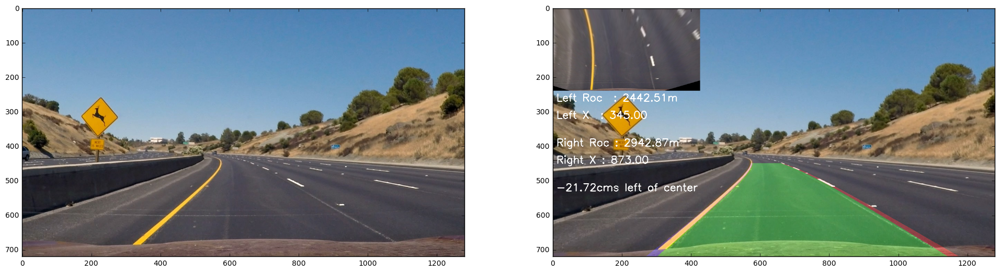

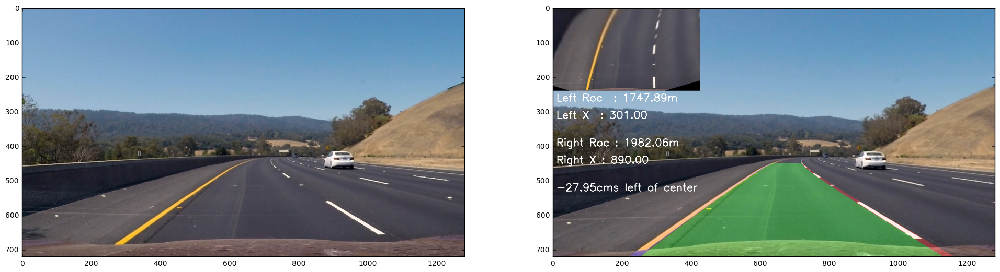

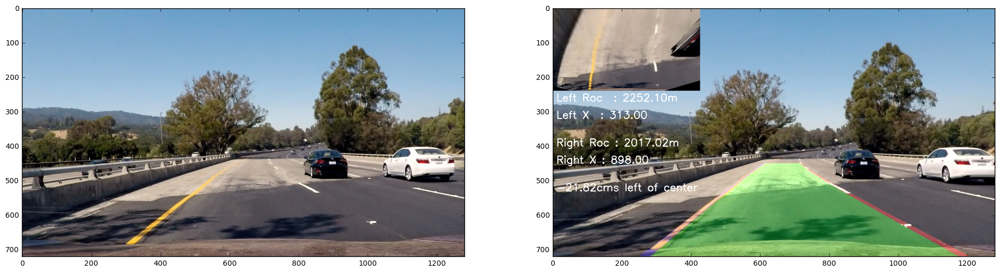

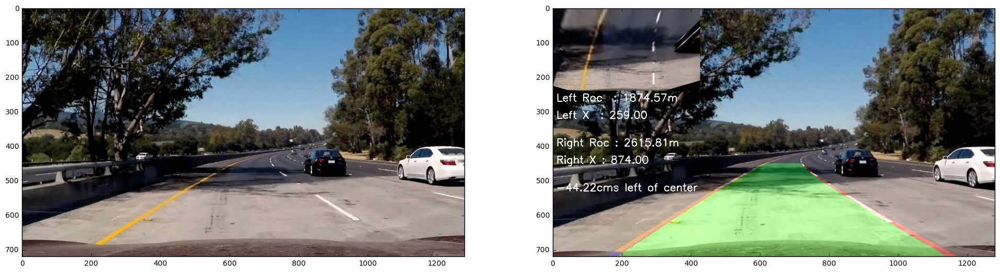

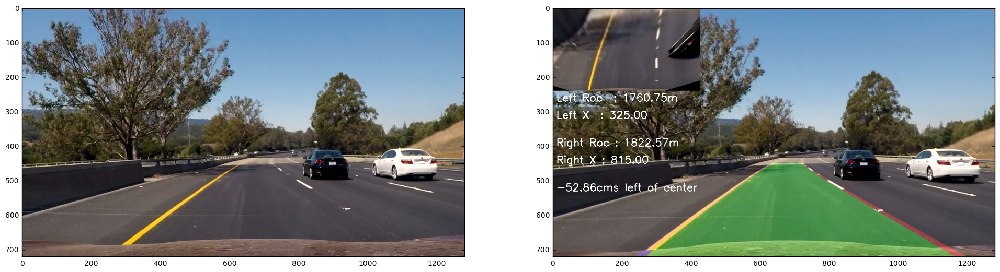

In [9]:
# Define camera and calibrate it
camera = Camera(nx=9, ny=6, show_images=False)
camera.calibrate("./camera_calibration_images/calibration*.jpg")

# Load image files
images = glob.glob("./test_images/test*.jpg")

for image in images:
    print('Processing image {}'.format(image))
    
    # Read image
    img = mpimg.imread(image)

    # Define lane detector
    laneDetector = LaneDetector(show_images=False)

    # Process the images
    combined_img = process_image(img)
    
    # Plot original and combined image
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    ax1.imshow(img)
    ax2.imshow(combined_img)

plt.show()


# ** Video Pipeline **

In [10]:
# Define camera and calibrate it
camera = Camera(nx=9, ny=6, show_images=False)
camera.calibrate("./camera_calibration_images/calibration*.jpg")

# Define lane detector
laneDetector = LaneDetector(show_images=False)

# Process the video
clip = VideoFileClip("./test_videos/project_video.mp4")
output_video = "./test_videos/project_video_processed.mp4"
output_clip = clip.fl_image(process_image)
output_clip.write_videofile(output_video, audio=False)

Calibrating camera...
[MoviePy] >>>> Building video ./test_videos/project_video_processed.mp4
[MoviePy] Writing video ./test_videos/project_video_processed.mp4


100%|█████████▉| 1260/1261 [03:13<00:00,  6.41it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./test_videos/project_video_processed.mp4 



Here is the link of processed video: [Link](https://youtu.be/rG7C_o1lOWs)

# ** Further Improvment **

This project was surprisingly difficult and time consuming. The filter pipeline has many parameters that have to be optimized which was at first very time consuming. Some improvment could be:

* Developing better criteria to differentiate between good and bad fits.
* Finding dynamic coordinates to generate perspective transform matrix instead of fixed coordinates
* The pipeline will likely fail in many situations, including: Rapid changes of lighting, Changes of the color hues due to solar altitude, Adverse weather (rain, snow), Different lighting at night (including headlight dazzle), Sharp turns. For solving these issues and having more robust system, I should make some improvment in Binary Thresholding stage and polyline fiting.